In [1]:
import torch
import os
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from diffusion_utils import *
import torch.nn.functional as func
from model import UNETv4

In [2]:
# hyperparameters

# diffusion hyperparameters
timesteps = 500
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
width = 128
height = 800 # 16x16 image
save_dir = r'.\weights'

# training hyperparameters
batch_size = 4
n_epoch = 32
lrate = 1e-3

In [3]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

nn_model = UNETv4(in_channels=3, out_channels=1).to(device)

In [4]:
# define sampling function for DDIM   
# removes the noise using ddim
def denoise_ddim(x, ab, ab_prev, pred_noise):
    ab = ab
    ab_prev = ab_prev
    
    x0_pred = ab_prev.sqrt() / ab.sqrt() * (x - (1 - ab).sqrt() * pred_noise)
    dir_xt = (1 - ab_prev).sqrt() * pred_noise

    return x0_pred + dir_xt

Loaded in Model


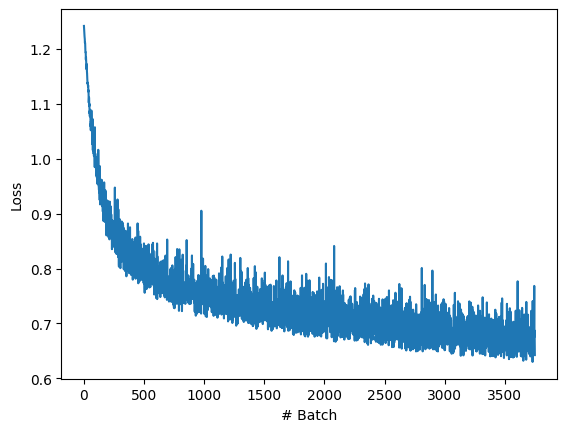

In [5]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load(f"{save_dir}\\model_5.pth", map_location=device))
nn_model.eval() 

loss_npy = np.load(f"{save_dir}\\loss_5.npy")
plt.plot(loss_npy)
plt.xlabel('# Batch')
plt.ylabel('Loss')
print("Loaded in Model")

In [6]:
input_folder = r'C:\Users\sebas\Documents\MATLAB\DataProCiencia\Attenuation\DiffusionBeamformer\input_id'
output_folder = r'C:\Users\sebas\Documents\MATLAB\DataProCiencia\Attenuation\DiffusionBeamformer\target_enh'
dataset = CustomDataset(input_folder, output_folder)
print(f'Dataset length: {len(dataset)}')
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
x_sample, y_sample = next(iter(train_loader))
print(x_sample.shape)
print(y_sample.shape)

Dataset length: 243
torch.Size([4, 2, 800, 128])
torch.Size([4, 1, 800, 128])


In [31]:
# sample quickly using DDIM
@torch.no_grad()
def sample_ddim(x, step_size, model, device):
    # x_T ~ N(0, 1), sample initial noise
    output_shape = list(x.shape)
    output_shape[1] = 1
    output = torch.randn(output_shape).to(device)
    input_model = torch.cat((x, output), 1)

    step_size = int(step_size)
    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -step_size):
        print(f'sampling timestep {i:3d}', end='\n')
        # reshape time tensor
        t = torch.tensor([i])[:, None, None, None].to(device)
        eps = model(input_model, t)    # predict noise e_(x_t,t)
        output = denoise_ddim(output, ab_t[i], ab_t[i - step_size], eps)
        
        # fig, axs = plt.subplots(2, 2, figsize=(6, 6))
        # for iSample in range(batch_size):
        #     im = axs[iSample//2][iSample%2].imshow(output[iSample,0,:,:], extent=[-20,20,50,0],cmap='gray')
        #     im.set_clim(0,1)
        #     axs[iSample//2][iSample%2].set_title(f'Sample {iSample}')
        #     plt.colorbar(mappable=im,ax=axs[iSample//2][iSample%2])
        # plt.tight_layout()
        # plt.show()

        intermediate.append(output.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return output, intermediate


In [8]:
samples, intermediate = sample_ddim(x_sample, step_size=25, model=nn_model, device=device)

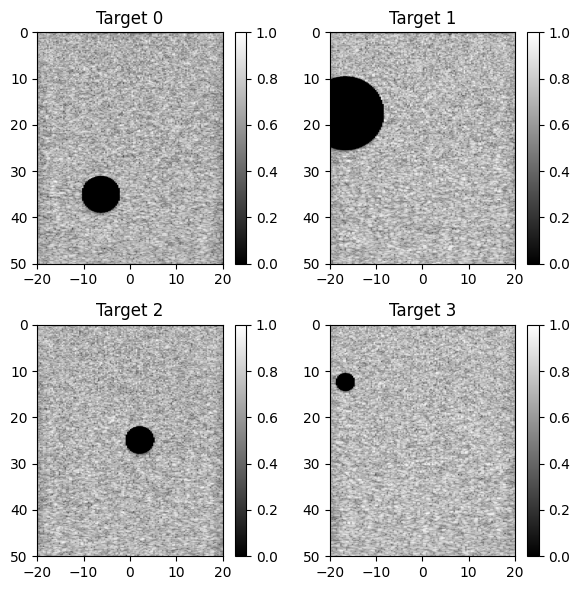

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6))
for iSample in range(batch_size):
    im = axs[iSample//2][iSample%2].imshow(y_sample[iSample,0,:,:], extent=[-20,20,50,0],cmap='gray')
    axs[iSample//2][iSample%2].set_title(f'Target {iSample}')
    plt.colorbar(mappable=im,ax=axs[iSample//2][iSample%2])
plt.tight_layout()
plt.show()

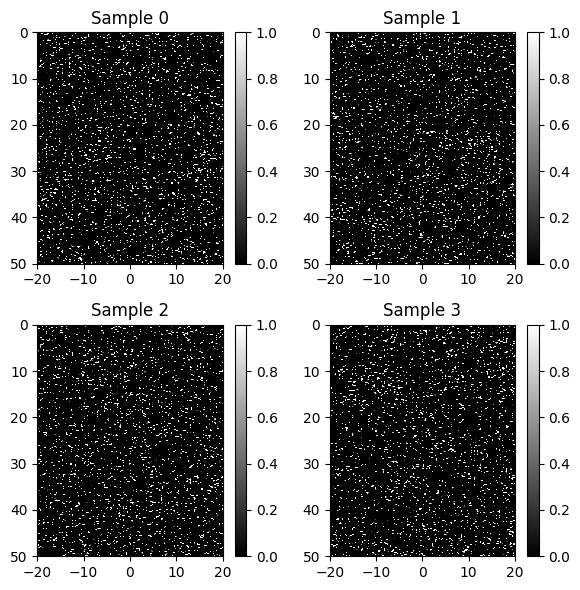

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6))
for iSample in range(batch_size):
    im = axs[iSample//2][iSample%2].imshow(samples[iSample,0,:,:], extent=[-20,20,50,0],cmap='gray')
    im.set_clim(0,1)
    axs[iSample//2][iSample%2].set_title(f'Sample {iSample}')
    plt.colorbar(mappable=im,ax=axs[iSample//2][iSample%2])
plt.tight_layout()
plt.show()

In [11]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

fig, axs = plt.subplots(2, 2, figsize=(6, 6))
for iSample in range(batch_size):
    current_ax = axs[iSample//2][iSample%2]
    current_ax.set_title(f'Sample {iSample}')
    artist_im = current_ax.imshow(intermediate[0,iSample,0,:,:], extent=[-20,20,50,0], cmap='gray')
    artist_im.set_clim(0,1)
    plt.colorbar(mappable=artist_im,ax=current_ax)
plt.tight_layout()

def update(frame):
    artist_arr = []
    for iSample in range(batch_size):
        current_ax = axs[iSample//2][iSample%2]
        # current_ax.clear()
        # current_ax.set_title(f'Sample {iSample}')
        artist_im = current_ax.imshow(intermediate[frame,iSample,0,:,:], extent=[-20,20,50,0], cmap='gray')
        artist_im.set_clim(0,1)
        # plt.colorbar(mappable=artist_im,ax=current_ax)
        artist_arr.append(artist_im)
    return artist_arr

num_frames = intermediate.shape[0]
print("Creating animation...")
ani = FuncAnimation(fig=fig, func=update, frames=num_frames, interval=30)
plt.close()

print("Saving gif...")
ani.save(f"test.gif", dpi=100, writer=PillowWriter(fps=30))

print("Converting animation to html...")
HTML(ani.to_jshtml())


Creating animation...
Saving gif...
Converting animation to html...


# NEW MODEL
Only 1 epoch was trained, so choose model_0 and loss_0

Loaded in Model


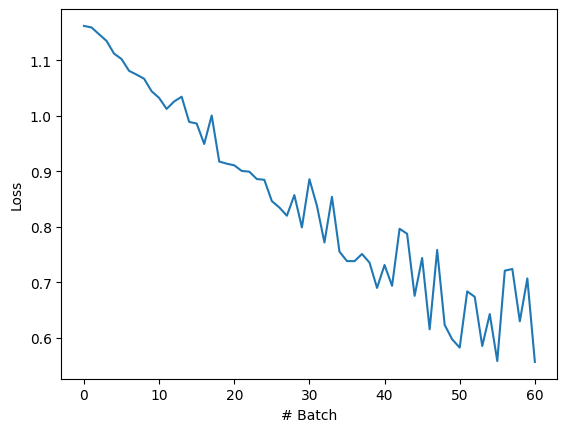

In [12]:
from model import UNETv5
new_model = UNETv5(in_channels=3, out_channels=1).to(device)
# load in model weights and set to eval mode
new_model.load_state_dict(torch.load(f"{save_dir}\\model_0.pth", map_location=device))
new_model.eval() 

loss_npy = np.load(f"{save_dir}\\loss_0.npy")
plt.plot(loss_npy)
plt.xlabel('# Batch')
plt.ylabel('Loss')
print("Loaded in Model")

In [ ]:
samples_new, intermediate_new = sample_ddim(x_sample, step_size=25, model=new_model, device=device)

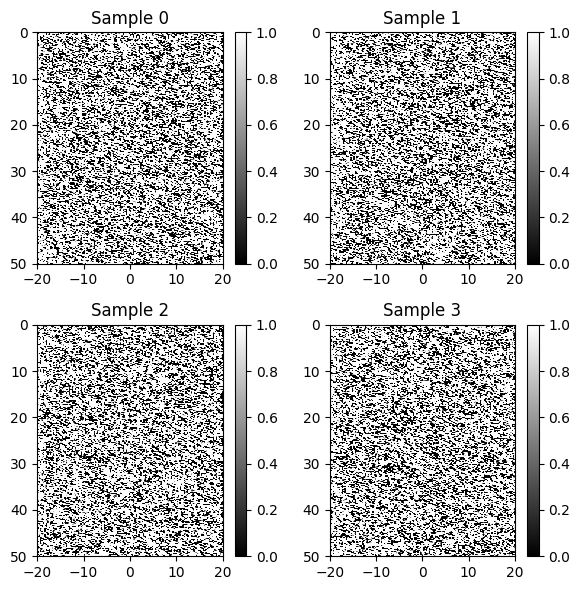

In [46]:
fig, axs = plt.subplots(2, 2, figsize=(6, 6))
for iSample in range(batch_size):
    im = axs[iSample//2][iSample%2].imshow(samples_new[iSample,0,:,:], extent=[-20,20,50,0],cmap='gray')
    im.set_clim(0,1)
    axs[iSample//2][iSample%2].set_title(f'Sample {iSample}')
    plt.colorbar(mappable=im,ax=axs[iSample//2][iSample%2])
plt.tight_layout()
plt.show()

In [38]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

fig, axs = plt.subplots(2, 2, figsize=(6, 6))
for iSample in range(batch_size):
    current_ax = axs[iSample//2][iSample%2]
    current_ax.set_title(f'Sample {iSample}')
    artist_im = current_ax.imshow(intermediate_new[0,iSample,0,:,:], extent=[-20,20,50,0], cmap='gray')
    artist_im.set_clim(0,1)
    plt.colorbar(mappable=artist_im,ax=current_ax)
plt.tight_layout()

def update(frame):
    artist_arr = []
    for iSample in range(batch_size):
        current_ax = axs[iSample//2][iSample%2]
        # current_ax.clear()
        # current_ax.set_title(f'Sample {iSample}')
        artist_im = current_ax.imshow(intermediate_new[frame,iSample,0,:,:], extent=[-20,20,50,0], cmap='gray')
        artist_im.set_clim(0,1)
        # plt.colorbar(mappable=artist_im,ax=current_ax)
        artist_arr.append(artist_im)
    return artist_arr

num_frames = intermediate_new.shape[0]
print("Creating animation...")
ani = FuncAnimation(fig=fig, func=update, frames=num_frames, interval=30)
plt.close()

# print("Saving gif...")
# ani.save(f"test.gif", dpi=100, writer=PillowWriter(fps=30))

print("Converting animation to html...")
HTML(ani.to_jshtml())

Creating animation...
Converting animation to html...
